# Visualizing clusters

## importing libraries

In [63]:
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import numpy as np
import geopandas as gpd
import mapclassify as mp
import matplotlib.colors as mcolors
from matplotlib.cm import viridis, turbo, RdYlGn, magma, nipy_spectral, jet, gist_rainbow, CMRmap, terrain, gnuplot
import matplotlib.patches as mpatches


## Importing territories

### importing Cantons

In [64]:
Swiss_cantons = gpd.read_file('../data/Spatial_data/SwissBOUNDARIES_shp/swissBOUNDARIES3D_1_5_TLM_KANTONSGEBIET.shp')
Swiss_cantons.columns

Index(['UUID', 'DATUM_AEND', 'DATUM_ERST', 'ERSTELL_J', 'ERSTELL_M',
       'GRUND_AEND', 'HERKUNFT', 'HERKUNFT_J', 'HERKUNFT_M', 'REVISION_J',
       'REVISION_M', 'REVISION_Q', 'OBJEKTART', 'KANTONSNUM', 'SEE_FLAECH',
       'KANTONSFLA', 'NAME', 'ICC', 'EINWOHNERZ', 'geometry'],
      dtype='object')

### Importing Municipalities

In [65]:
# Load the GeoJSON or Shapefile
# Replace 'path_to_file' with the actual file path of your GeoJSON or shapefile
switzerland_municipalities = gpd.read_file('../data/Spatial_data/SwissBOUNDARIES_shp/swissBOUNDARIES3D_1_5_TLM_HOHEITSGEBIET.shp')  # or .shp
switzerland_municipalities["BFS_NUMMER"]

0        131
1       3714
2       5722
3       6730
4       4123
        ... 
2152    5803
2153    4002
2154    6157
2155    4841
2156    2767
Name: BFS_NUMMER, Length: 2157, dtype: int64

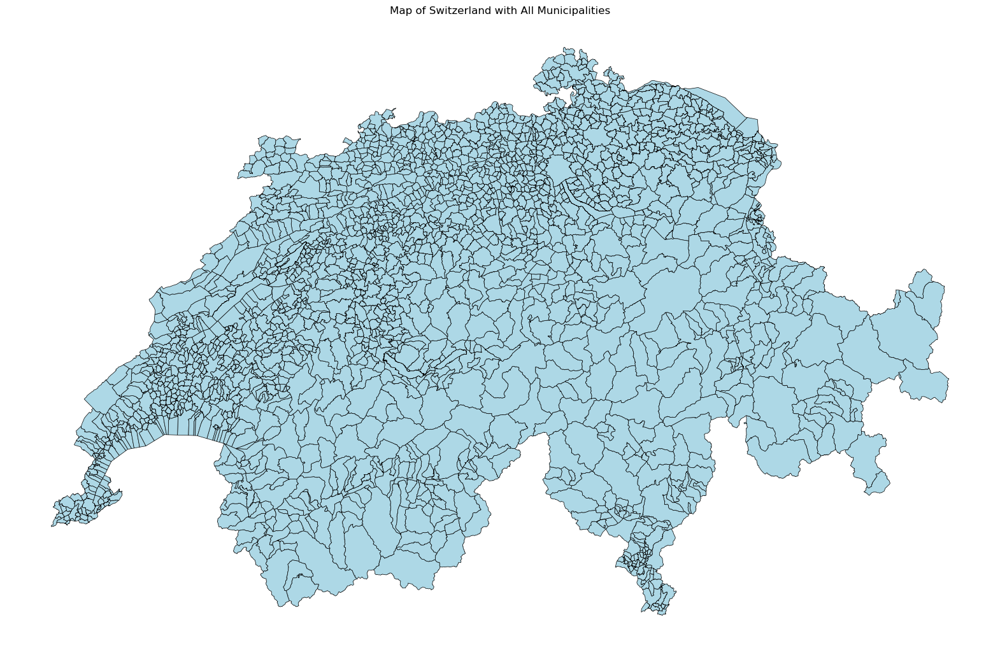

In [66]:
# Plot the map
fig, ax = plt.subplots(figsize=(20, 15))
switzerland_municipalities.plot(ax=ax, color='lightblue', edgecolor='black', linewidth=0.5)
plt.title("Map of Switzerland with All Municipalities")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.axis("off")  # Turn off axis
plt.show()

## creating gpd obejct with municipality shapes 

In [67]:
Solar_potential_df = pd.read_csv("../data/cleaned_data/Municipal_solar_types.csv")

solar_mun_df = pd.merge(Solar_potential_df, switzerland_municipalities, left_on="mun_id", right_on="BFS_NUMMER")

solar_mun_gpd = gpd.GeoDataFrame(solar_mun_df, geometry=solar_mun_df.geometry)
solar_mun_gpd


,mun_name,canton_abr,pv_pot,pv_pot_reco,fpv_pot,fpv_pot_reco,roof_area,facade_area,total_power,total_energy,...,BEZIRKSNUM,KANTONSNUM,NAME,GEM_FLAECH,SEE_FLAECH,ICC,SHN,EINWOHNERZ,HIST_NR,geometry
0,Aeugst am Albis,ZH,1.910714e+07,1.348543e+07,8.666142e+06,5.140205e+06,177869.927003,184175.446768,1514.66,1514660.0,...,101.0,1.0,Aeugst am Albis,791.0,0.0,CH,CH01010001,1991,13256.0,"POLYGON Z ((2680604.962 1236344.185 720.723, 2..."
1,Affoltern am Albis,ZH,6.727411e+07,5.286801e+07,3.796268e+07,2.211373e+07,653710.145217,800320.664453,3988.31,3988310.0,...,101.0,1.0,Affoltern am Albis,1059.0,0.0,CH,CH01010002,12588,11742.0,"POLYGON Z ((2673825.715 1238537.954 463.765, 2..."
2,Bonstetten,ZH,2.807809e+07,2.086292e+07,1.442854e+07,7.962732e+06,271607.933081,316012.443845,1620.22,1620220.0,...,101.0,1.0,Bonstetten,743.0,0.0,CH,CH01010003,5624,11801.0,"POLYGON Z ((2675810.595 1241034.379 579.434, 2..."
3,Hausen am Albis,ZH,3.620122e+07,2.583782e+07,1.747077e+07,1.067574e+07,342510.943327,371456.902241,3073.58,3073580.0,...,101.0,1.0,Hausen am Albis,1360.0,0.0,CH,CH01010004,3879,11992.0,"POLYGON Z ((2686028.446 1230192.476 545.697, 2..."
4,Hedingen,ZH,2.659854e+07,1.953973e+07,1.247946e+07,7.409044e+06,250280.021025,267799.223428,2708.86,2708860.0,...,101.0,1.0,Hedingen,653.0,0.0,CH,CH01010005,3871,12249.0,"POLYGON Z ((2675425.18 1240959.266 609.156, 26..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2126,Clos du Doubs,JU,2.202651e+07,1.540188e+07,9.230486e+06,5.639726e+06,203218.882899,197414.877889,1520.47,1520470.0,...,2603.0,26.0,Clos du Doubs,6175.0,0.0,CH,CH26036808,1275,14965.0,"POLYGON Z ((2581281.96 1244204.79 792.496, 258..."
2127,Haute-Ajoie,JU,2.244028e+07,1.720105e+07,8.837971e+06,5.620396e+06,203478.363883,184334.358886,1073.43,1073430.0,...,2603.0,26.0,Haute-Ajoie,4093.0,0.0,CH,CH26036809,1052,16120.0,"POLYGON Z ((2563679.121 1250609.224 569.144, 2..."
2128,La Baroche,JU,1.956048e+07,1.420631e+07,8.351648e+06,5.278561e+06,186315.994717,176702.694863,2117.99,2117990.0,...,2603.0,26.0,La Baroche,3107.0,0.0,CH,CH26036810,1114,14969.0,"POLYGON Z ((2580223.058 1248328.773 919.732, 2..."
2129,Damphreux-Lugnez,JU,6.412274e+06,4.656797e+06,2.726437e+06,1.746839e+06,57963.178088,55074.448769,512.12,512120.0,...,2603.0,26.0,Damphreux-Lugnez,1077.0,0.0,CH,CH26036811,370,16627.0,"POLYGON Z ((2575404.376 1260532.491 533.089, 2..."


## Vizualisation exploration of achieved solar potential


### Linear scale

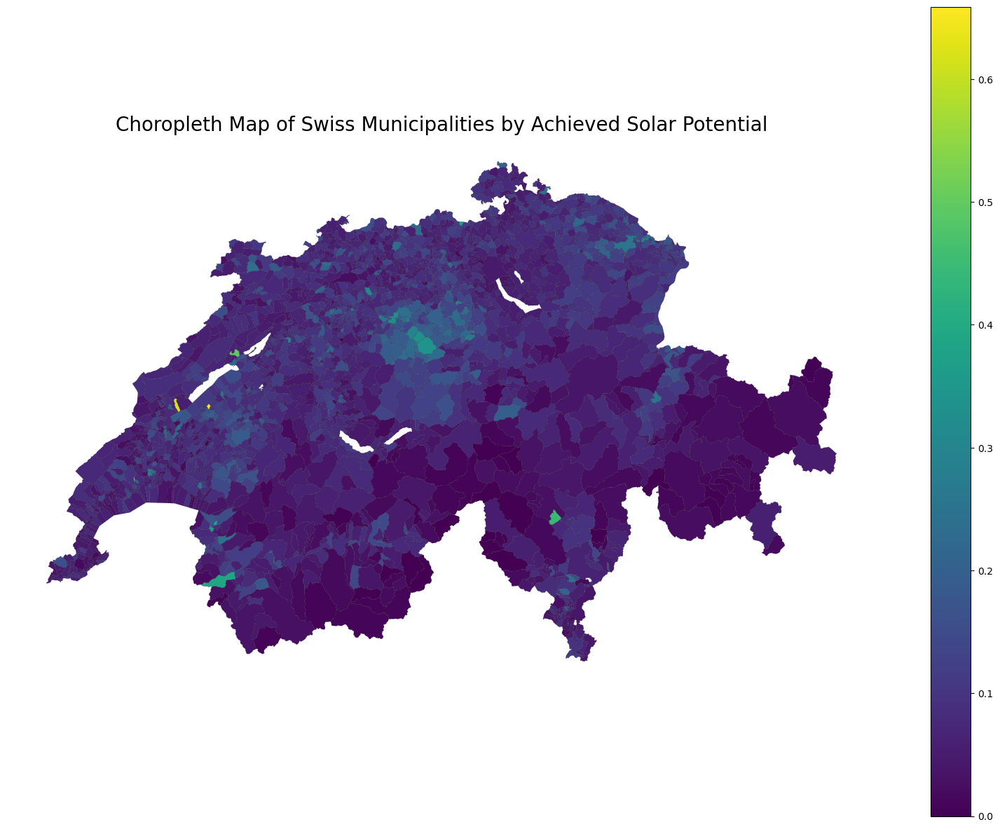

In [68]:
# Plot the choropleth map
fig, ax = plt.subplots(figsize=(20, 15))

# Plot using the GeoDataFrame `solar_mun_df`
solar_mun_gpd.plot(
    ax=ax,
    column='achieved_rp',  # Use the column to determine the color
    cmap='viridis',                     # Colormap for shading (e.g., 'viridis', 'coolwarm', etc.)
    legend=True,                        # Display a legend
    edgecolor='black',                  # Add boundaries for municipalities
    linewidth=0.1                       # Thin line for boundaries
)

# Add a title
plt.title("Choropleth Map of Swiss Municipalities by Achieved Solar Potential", size=20)

# Turn off axis ticks and labels for a cleaner map
plt.axis("off")

# Show the plot
plt.show()


### Natural breaks

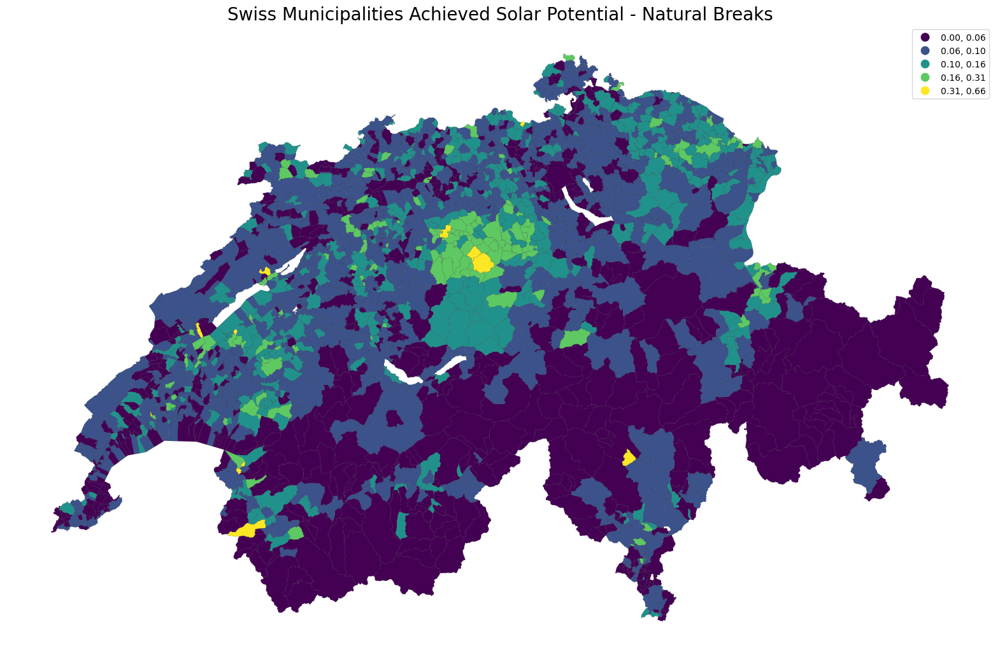

'Quantiles: Equal number of observations per bin.\nEqualInterval: Equal range of values in each bin.\nFisherJenks: Similar to natural breaks but optimizes grouping.\nBoxPlot: Based on statistical quartiles and whiskers.\nHeadTailBreaks: For heavy-tailed distributions.\nStdMean: Classification around mean and standard deviations.\nMaximumBreaks: Uses large gaps in data to determine breaks.'

In [69]:

# Plot the choropleth map
fig, ax = plt.subplots(figsize=(20, 15))

# Plot using the GeoDataFrame `solar_mun_df`
solar_mun_gpd.plot(
    ax=ax,
    column='achieved_rp',  # Use the column to determine the color
    cmap='viridis',                     # Colormap for shading (e.g., 'viridis', 'coolwarm', etc.)
    legend=True,                        # Display a legend
    edgecolor='black',                  # Add boundaries for municipalities
    linewidth=0.1, 
    scheme='NaturalBreaks',  # Use quantile bins (e.g., 'EqualInterval', 'NaturalBreaks')
    k=5                  # Number of bins                       # Thin line for boundaries
)

# Add a title
plt.title("Choropleth Map of Swiss Municipalities by Achieved Solar Potential", size=20)

# Turn off axis ticks and labels for a cleaner map
plt.axis("off")

plt.title("Swiss Municipalities Achieved Solar Potential - Natural Breaks", fontsize=20)
plt.xlabel("Longitude", fontsize=14)
plt.ylabel("Latitude", fontsize=14)

# Show the plot
plt.show()

"""" POSSIBLE ALTERNATIVES """
"""Quantiles: Equal number of observations per bin.
EqualInterval: Equal range of values in each bin.
FisherJenks: Similar to natural breaks but optimizes grouping.
BoxPlot: Based on statistical quartiles and whiskers.
HeadTailBreaks: For heavy-tailed distributions.
StdMean: Classification around mean and standard deviations.
MaximumBreaks: Uses large gaps in data to determine breaks."""

In [70]:
#classification = mp.NaturalBreaks(solar_mun_gpd['achieved_rp'], k=5)
classification = mp.BoxPlot(solar_mun_gpd['achieved_rp'])
print(classification)  # Display the bin edges

BoxPlot

   Interval      Count
----------------------
( -inf, -0.02] |     0
(-0.02,  0.05] |   533
( 0.05,  0.07] |   533
( 0.07,  0.10] |   532
( 0.10,  0.18] |   421
( 0.18,  0.66] |   112


### Std & mean 

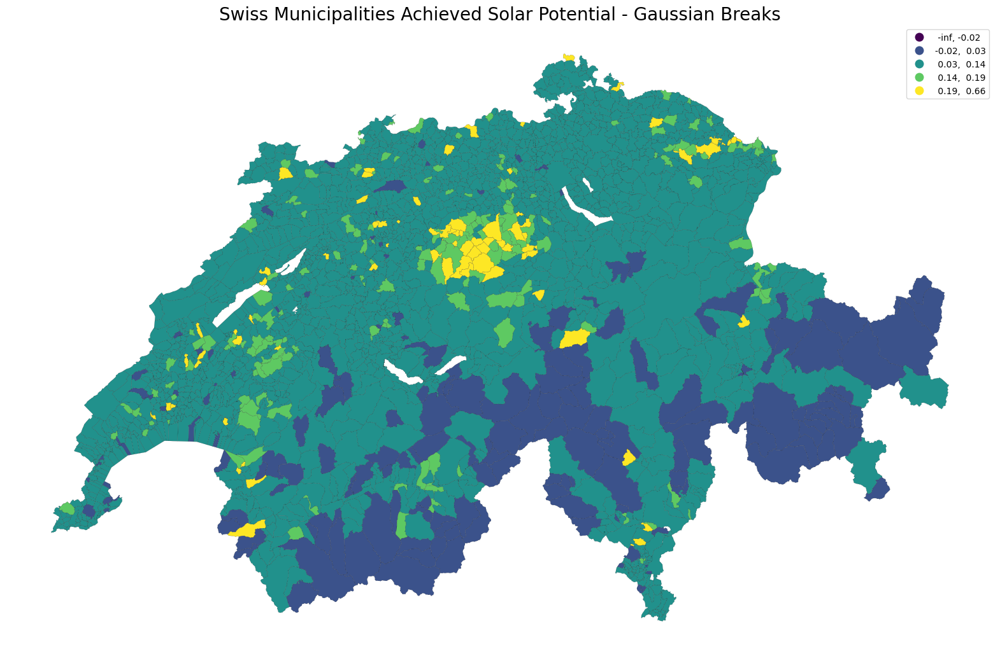

In [71]:
# Plot the choropleth map
fig, ax = plt.subplots(figsize=(20, 15))

# Plot using the GeoDataFrame `solar_mun_df`
solar_mun_gpd.plot(
    ax=ax,
    column='achieved_rp',  # Use the column to determine the color
    cmap='viridis',                     # Colormap for shading (e.g., 'viridis', 'coolwarm', etc.)
    legend=True,                        # Display a legend
    edgecolor='black',                  # Add boundaries for municipalities
    linewidth=0.1, 
    scheme='StdMean',  # Use quantile bins (e.g., 'EqualInterval', 'NaturalBreaks')
    k=8                  # Number of bins                       # Thin line for boundaries
)

# Add a title
plt.title("Choropleth Map of Swiss Municipalities by Achieved Solar Potential", size=20)

# Turn off axis ticks and labels for a cleaner map
plt.axis("off")

plt.title("Swiss Municipalities Achieved Solar Potential - Gaussian Breaks", fontsize=20)
plt.xlabel("Longitude", fontsize=14)
plt.ylabel("Latitude", fontsize=14)

# Show the plot
plt.show()


### EquallInterval

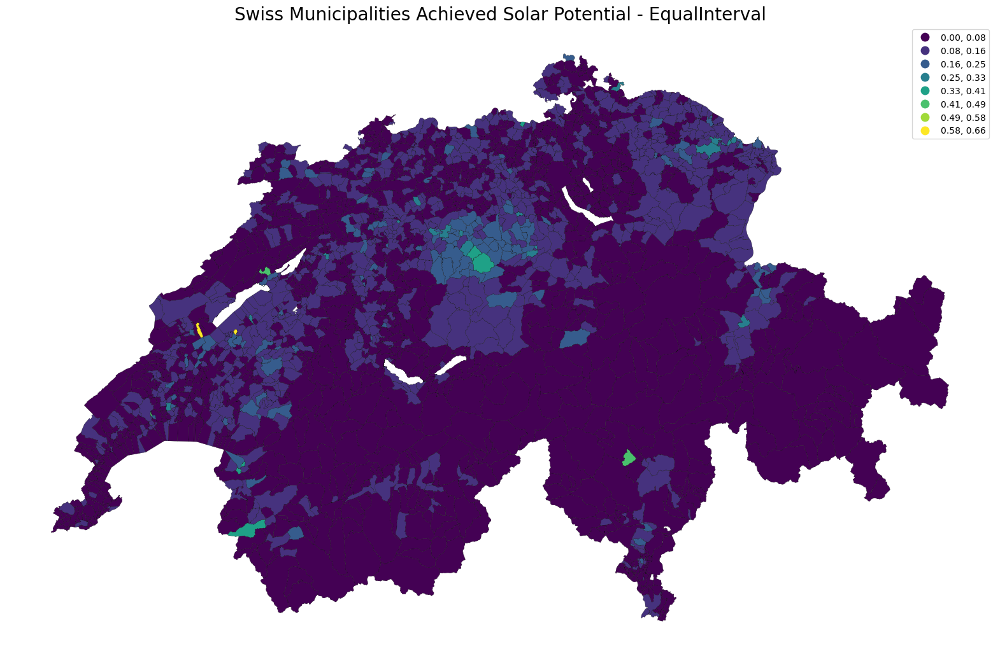

In [72]:
# Plot the choropleth map
fig, ax = plt.subplots(figsize=(20, 15))

# Plot using the GeoDataFrame `solar_mun_df`
solar_mun_gpd.plot(
    ax=ax,
    column='achieved_rp',  # Use the column to determine the color
    cmap='viridis',                     # Colormap for shading (e.g., 'viridis', 'coolwarm', etc.)
    legend=True,                        # Display a legend
    edgecolor='black',                  # Add boundaries for municipalities
    linewidth=0.2, 
    scheme='EqualInterval',  # Use quantile bins (e.g., 'EqualInterval', 'NaturalBreaks')
    k=8                  # Number of bins                       # Thin line for boundaries
)

# Add a title
plt.title("Choropleth Map of Swiss Municipalities by Achieved Solar Potential", size=20)

# Turn off axis ticks and labels for a cleaner map
plt.axis("off")

plt.title("Swiss Municipalities Achieved Solar Potential - EqualInterval", fontsize=20)
plt.xlabel("Longitude", fontsize=14)
plt.ylabel("Latitude", fontsize=14)

# Show the plot
plt.show()

### BoxPlot

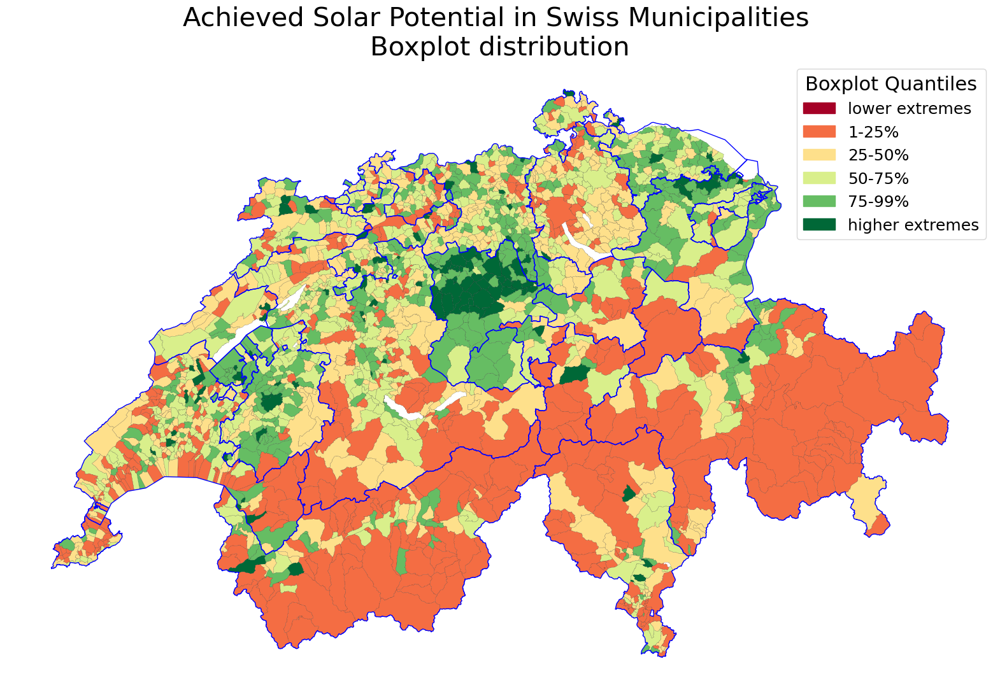

In [73]:
# Generate a list of colors equally spaced on the viridis palette
n_colors = 6  # Assuming 8 types of municipalities
colors_RdYlGn = [RdYlGn(i / (n_colors - 1)) for i in range(n_colors)]  # RGBA tuples

# Convert to HEX for consistent representation
colors_RdYlGn_hex = [mcolors.to_hex(c) for c in colors_RdYlGn]


# Define categories for the legend
categories = ["lower extremes", "1-25%", "25-50%", "50-75%", "75-99%", "higher extremes" ]


# Plot the choropleth map
fig, ax = plt.subplots(figsize=(20, 15))

# Plot using the GeoDataFrame `solar_mun_df`
solar_mun_gpd.plot(
    ax=ax,
    column='achieved_rp',  # Use the column to determine the color
    cmap='RdYlGn',                     # Colormap for shading (e.g., 'viridis', 'coolwarm', etc.)
    legend=True,                        # Display a legend
    edgecolor='black',                  # Add boundaries for municipalities
    linewidth=0.1, 
    scheme='BoxPlot',  # Use quantile bins (e.g., 'EqualInterval', 'NaturalBreaks')
    #k=4             # Number of bins                       # Thin line for boundaries
    legend_kwds={'fontsize': 20}      # Increase legend font size
)

Swiss_cantons.plot(
    ax=ax,
    legend=True,                        # Display a legend
    edgecolor='blue',                  # Add boundaries for municipalities
    facecolor='none',
    linewidth=1, 
)

# Create custom legend handles
legend_handles = [mpatches.Patch(color=color, label=category) for color, category in zip(colors_RdYlGn_hex, categories)]

# Add the custom legend to the plot with a specific title size and label size
plt.legend(
    handles=legend_handles,              # Specify the legend handles
    title="Boxplot Quantiles",           # Title of the legend
    fontsize=18,                          # Font size of the legend labels
    title_fontsize=22,                    # Font size of the legend title
)

# Turn off axis ticks and labels for a cleaner map
plt.axis("off")

plt.title("Achieved Solar Potential in Swiss Municipalities \nBoxplot distribution", fontsize=30)
#plt.xlabel("Longitude", fontsize=1)
#plt.ylabel("Latitude", fontsize=14)

# Show the plot
plt.show()

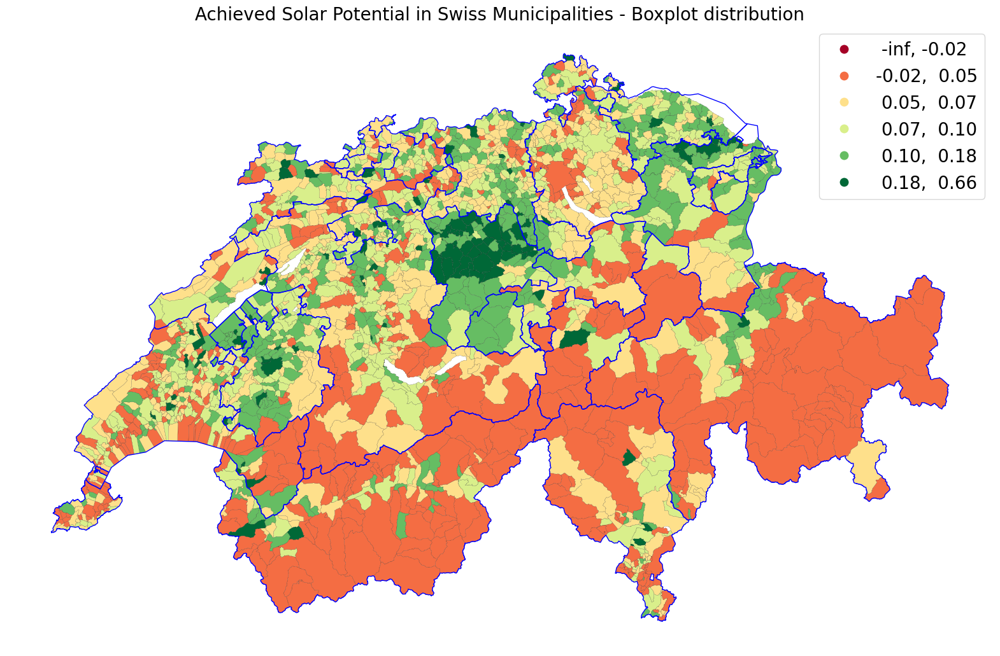

In [74]:
# Plot the choropleth map
fig, ax = plt.subplots(figsize=(20, 15))

# Plot using the GeoDataFrame `solar_mun_df`
solar_mun_gpd.plot(
    ax=ax,
    column='achieved_rp',  # Use the column to determine the color
    cmap='RdYlGn',                     # Colormap for shading (e.g., 'viridis', 'coolwarm', etc.)
    legend=True,                        # Display a legend
    edgecolor='black',                  # Add boundaries for municipalities
    linewidth=0.1, 
    scheme='BoxPlot',  # Use quantile bins (e.g., 'EqualInterval', 'NaturalBreaks')
    #k=4             # Number of bins                       # Thin line for boundaries
    legend_kwds={'fontsize': 20}      # Increase legend font size
)

Swiss_cantons.plot(
    ax=ax,
    legend=True,                        # Display a legend
    edgecolor='blue',                  # Add boundaries for municipalities
    facecolor='none',
    linewidth=1, 
)

# Add a title
plt.title("Choropleth Map of Swiss Municipalities by Achieved Solar Potential", size=30)

# Turn off axis ticks and labels for a cleaner map
plt.axis("off")

plt.title("Achieved Solar Potential in Swiss Municipalities - Boxplot distribution", fontsize=20)
plt.xlabel("Longitude", fontsize=14)
plt.ylabel("Latitude", fontsize=14)

# Show the plot
plt.show()

### Overall statistics

In [75]:
mean = solar_mun_gpd["achieved_rp"].mean()
std = solar_mun_gpd["achieved_rp"].std()

print(mean+std, mean+2*std)

0.13749866943858205 0.19092489406817414


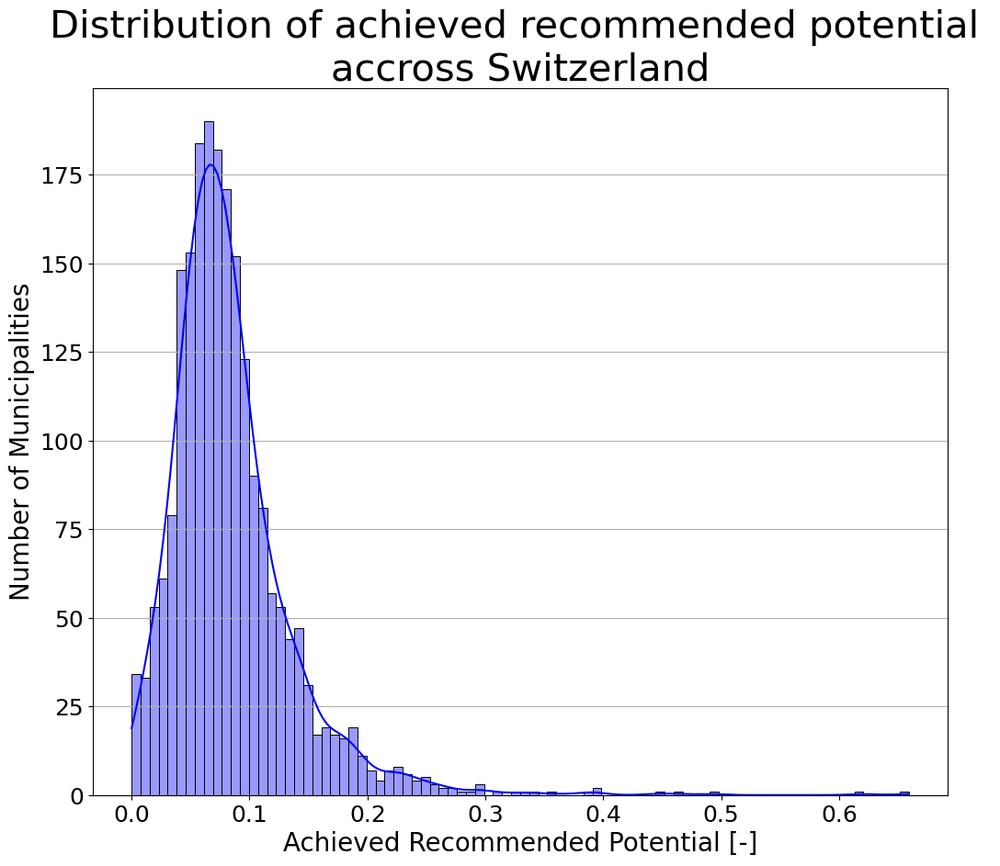

In [76]:
# Create the figure and axes
fig, ax = plt.subplots(figsize=(12, 10))

# Create the histplot with no KDE
sns.histplot(x="achieved_rp", data=solar_mun_gpd, ax=ax, color="blue", alpha=0.4, kde=True)

# Create the KDE plot separately and customize its color
#sns.kdeplot(x="achieved_rp", data=solar_mun_gpd, ax=ax, color="red", lw=2, fill=False, common_norm=False)  # Custom color for KDE

# Set grid for y-axis
plt.grid(axis="y")

# Set title for the plot
plt.title("Distribution of achieved recommended potential \naccross Switzerland", size=30)

# Remove x-ticks
#ax.set_xticks([])

# define axes labels 
plt.ylabel("Number of Municipalities", size=20)
plt.xlabel("Achieved Recommended Potential [-]", size=20)
plt.yticks(size=18)
plt.xticks(size=18)

# Show the plot
plt.show()


Counts: [32, 32, 42, 68, 68, 124, 135, 167, 198, 168, 172, 156, 128, 115, 73, 75, 57, 42, 46, 39, 32, 15, 18, 16, 17, 17, 11, 9, 2, 7, 7, 6, 6, 3, 4, 2, 4, 0, 1, 1, 3, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 1, 2, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1]
Bin Edges: [0.         0.00768726 0.01537451 0.02306177 0.03074903 0.03843629
 0.04612354 0.0538108  0.06149806 0.06918531 0.07687257 0.08455983
 0.09224709 0.09993434 0.1076216  0.11530886 0.12299611 0.13068337
 0.13837063 0.14605789 0.15374514 0.1614324  0.16911966 0.17680691
 0.18449417 0.19218143 0.19986869 0.20755594 0.2152432  0.22293046
 0.23061772 0.23830497 0.24599223 0.25367949 0.26136674 0.269054
 0.27674126 0.28442852 0.29211577 0.29980303 0.30749029 0.31517754
 0.3228648  0.33055206 0.33823932 0.34592657 0.35361383 0.36130109
 0.36898834 0.3766756  0.38436286 0.39205012 0.39973737 0.40742463
 0.41511189 0.42279914 0.4304864  0.43817366 0.44586092 0.45354817
 0.461

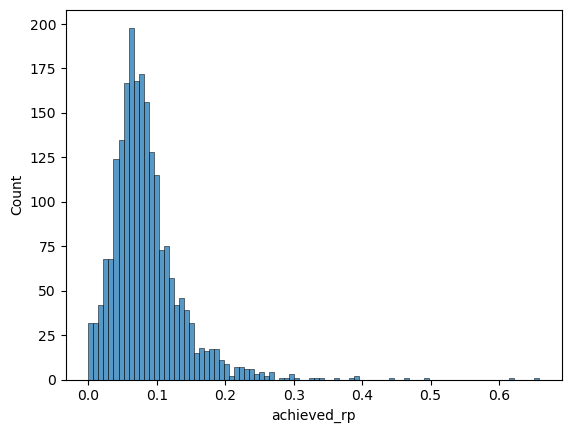

In [93]:
import seaborn as sns

# Example data
data = solar_mun_gpd["achieved_rp"]

# Create the plot
hist = sns.histplot(data, bins=90)

# Extract histogram data
counts = hist.patches
bin_edges = hist.get_xlim()  # Min and max range of the bins
bin_edges = np.linspace(0, bin_edges[1], len(counts) + 1)

# Print the results
print("Counts:", [patch.get_height() for patch in counts])
print("Bin Edges:", bin_edges)


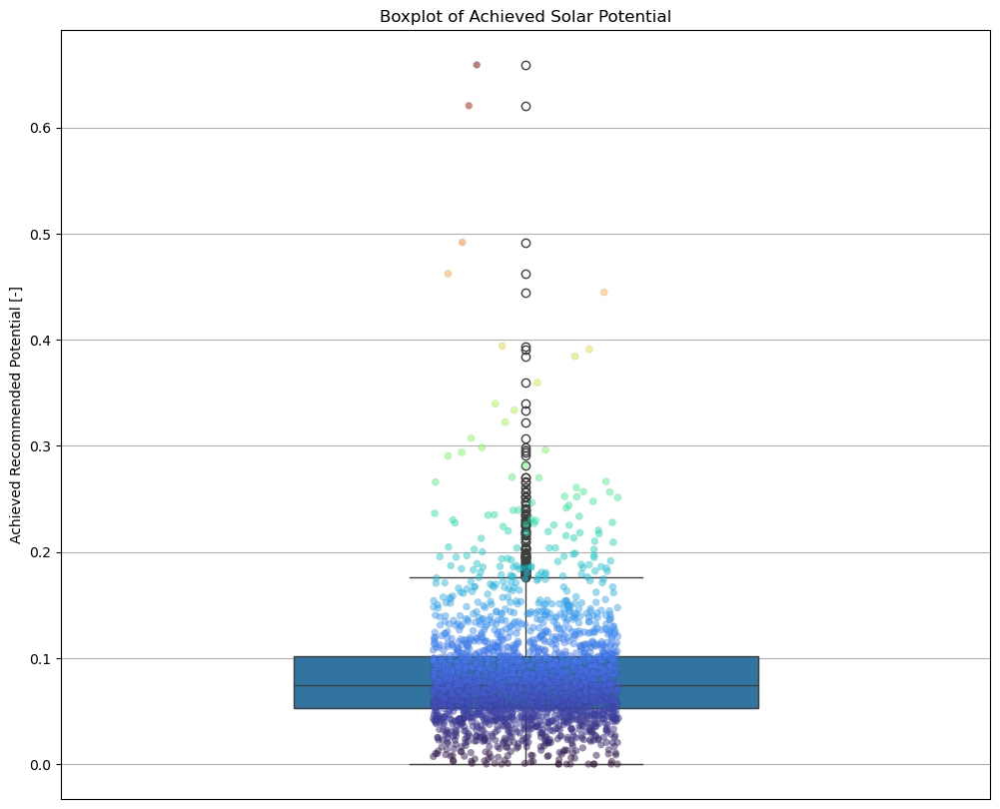

In [ ]:
# Create the figure and axes
fig, ax = plt.subplots(figsize=(12, 10))

# Create the boxplot with hue
sns.boxplot(y="achieved_rp", data=solar_mun_gpd, ax=ax, width=0.5)

# Create the stripplot with hue, but no legend for it
sns.stripplot(y='achieved_rp', hue='achieved_rp', data=solar_mun_gpd, jitter=True, linewidth=0.1, ax=ax, palette="turbo", alpha=0.5, legend=False)

# Set grid for y-axis
plt.grid(axis="y")

# Set title for the plot
plt.title("Boxplot of Achieved Solar Potential")

# Remove x-ticks
ax.set_xticks([])

# define axes labels 
plt.xlabel("")
plt.ylabel("Achieved Recommended Potential [-]")
# Show the plot
plt.show()


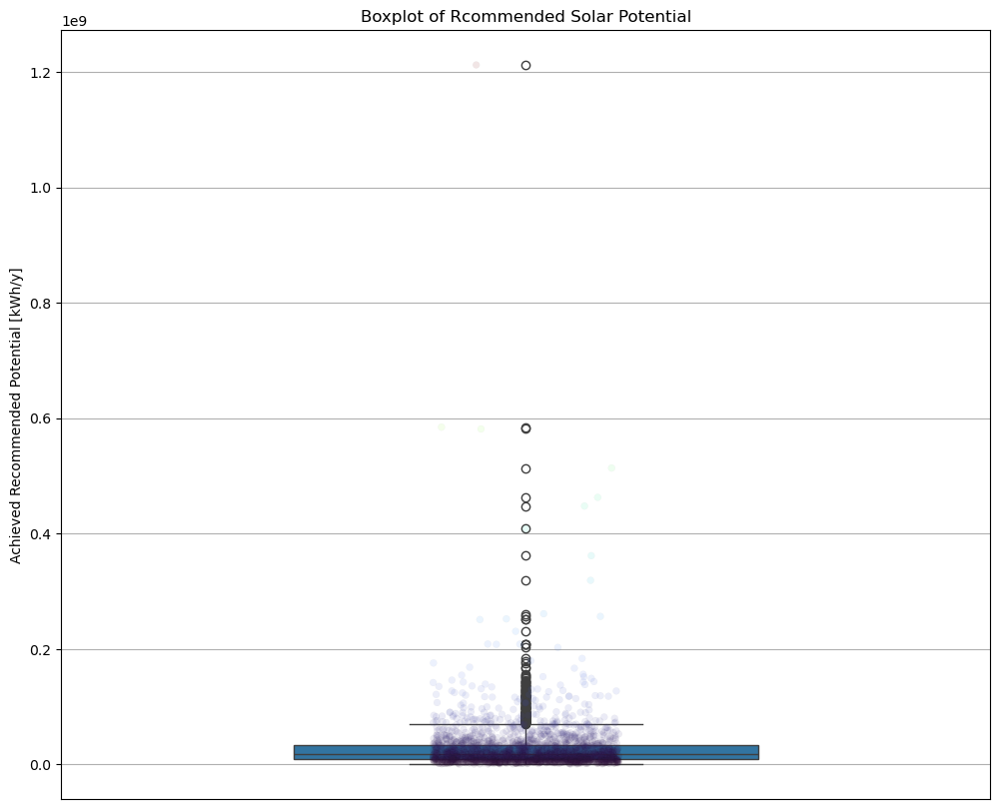

In [ ]:
# Create the figure and axes
fig, ax = plt.subplots(figsize=(12, 10))

# Create the boxplot with hue
sns.boxplot(y="recommended_potential", data=solar_mun_gpd, ax=ax, width=0.5)

# Create the stripplot with hue, but no legend for it
sns.stripplot(y='recommended_potential', hue='recommended_potential', data=solar_mun_gpd, jitter=True, linewidth=0.1, ax=ax, palette="turbo", alpha=0.1, legend=False)

# Set grid for y-axis
plt.grid(axis="y")

# Set title for the plot
plt.title("Boxplot of Rcommended Solar Potential")

# Remove x-ticks
ax.set_xticks([])

# define axes labels 
plt.xlabel("")
plt.ylabel("Achieved Recommended Potential [kWh/y]")
# Show the plot
#plt.ylim([0, 6*10**8])
plt.show()


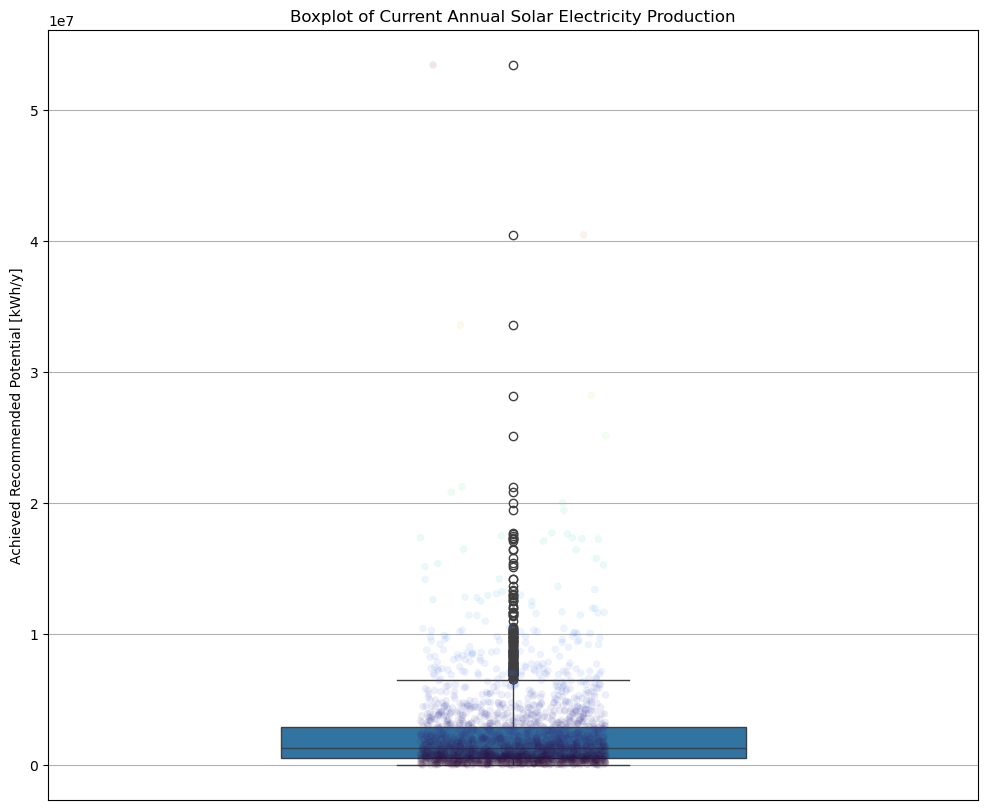

In [ ]:
# Create the figure and axes
fig, ax = plt.subplots(figsize=(12, 10))

# Create the boxplot with hue
sns.boxplot(y="total_energy", data=solar_mun_gpd, ax=ax, width=0.5)

# Create the stripplot with hue, but no legend for it
sns.stripplot(y='total_energy', hue='total_energy', data=solar_mun_gpd, jitter=True, linewidth=0.1, ax=ax, palette="turbo", alpha=0.1, legend=False)

# Set grid for y-axis
plt.grid(axis="y")

# Set title for the plot
plt.title("Boxplot of Current Annual Solar Electricity Production")

# Remove x-ticks
ax.set_xticks([])

# define axes labels 
plt.xlabel("")
plt.ylabel("Achieved Recommended Potential [kWh/y]")
# Show the plot
#plt.ylim([0, 6*10**8])
plt.show()

In [18]:
solar_mun_gpd.columns

Index(['mun_name', 'canton_abr', 'pv_pot', 'pv_pot_reco', 'fpv_pot',
       'fpv_pot_reco', 'roof_area', 'facade_area', 'total_power',
       'total_energy', 'initial_power', 'total_potential',
       'recommended_potential', 'achieved_rp', 'achieved_tp', 'Canton',
       'Country', 'Scenario1_RoofsOnly_PotentialSolarElectricity_GWh',
       'Scenario1_RoofsOnly_PotentialSolarElectricity_Month01_GWh',
       'Scenario1_RoofsOnly_PotentialSolarElectricity_Month02_GWh',
       'Scenario1_RoofsOnly_PotentialSolarElectricity_Month03_GWh',
       'Scenario1_RoofsOnly_PotentialSolarElectricity_Month04_GWh',
       'Scenario1_RoofsOnly_PotentialSolarElectricity_Month05_GWh',
       'Scenario1_RoofsOnly_PotentialSolarElectricity_Month06_GWh',
       'Scenario1_RoofsOnly_PotentialSolarElectricity_Month07_GWh',
       'Scenario1_RoofsOnly_PotentialSolarElectricity_Month08_GWh',
       'Scenario1_RoofsOnly_PotentialSolarElectricity_Month09_GWh',
       'Scenario1_RoofsOnly_PotentialSolarElectrici

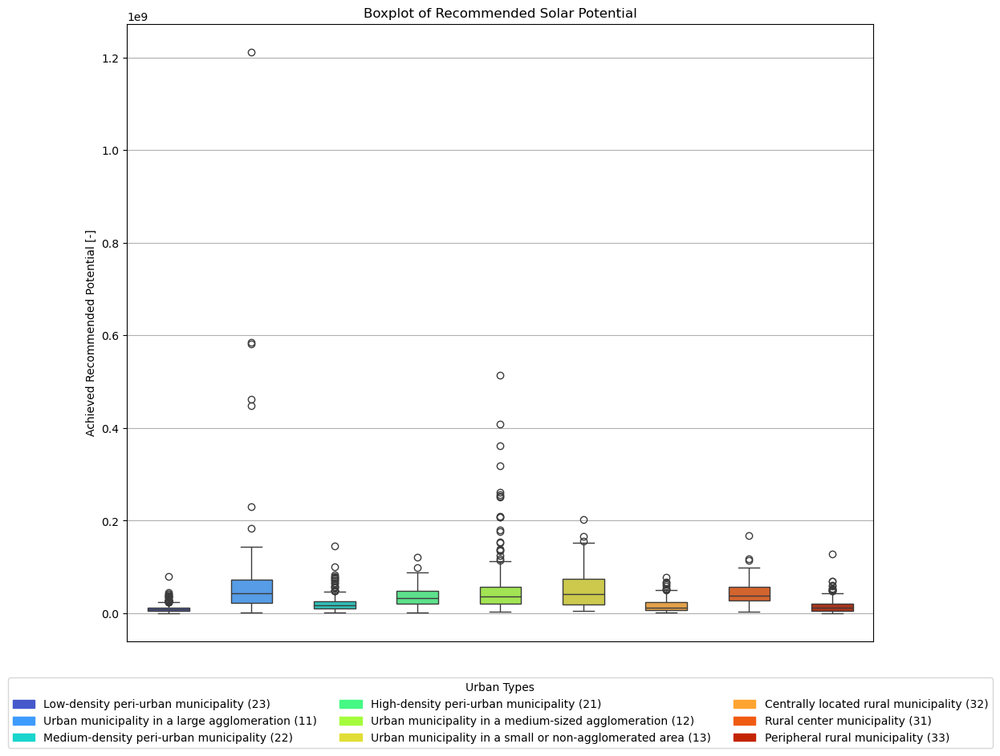

In [ ]:
# Create the figure and axes
fig, ax = plt.subplots(figsize=(12, 10))

# Create the boxplot with hue
sns.boxplot(x="urban_typo", y="recommended_potential", hue='urban_typo', data=solar_mun_gpd, ax=ax, palette="turbo", width=0.5)

# Create the stripplot with hue, but no legend for it
#sns.stripplot(x='urban_typo', y='recommended_potential', hue='urban_typo', data=solar_mun_gpd, jitter=True, linewidth=0.1, ax=ax, palette="turbo", alpha=0.5, legend=False)

# Set grid for y-axis
plt.grid(axis="y")

# Set title for the plot
plt.title("Boxplot of Recommended Solar Potential")

# Remove x-ticks
ax.set_xticks([])

# define axes labels 
plt.xlabel("")
plt.ylabel("Achieved Recommended Potential [-]")

# Manually create a legend
# Retrieve the colors used in the plot
palette = sns.color_palette("turbo", n_colors=len(solar_mun_gpd['urban_typo'].unique()))

# Create the legend using patches
patches = [mpatches.Patch(color=palette[i], label=str(label)) 
           for i, label in enumerate(solar_mun_gpd['urban_typo'].unique())]

# Add the legend below the plot using bbox_to_anchor
ax.legend(handles=patches, title="Urban Types", loc="upper center", bbox_to_anchor=(0.5, -0.05), ncol=3)

# Show the plot
plt.show()


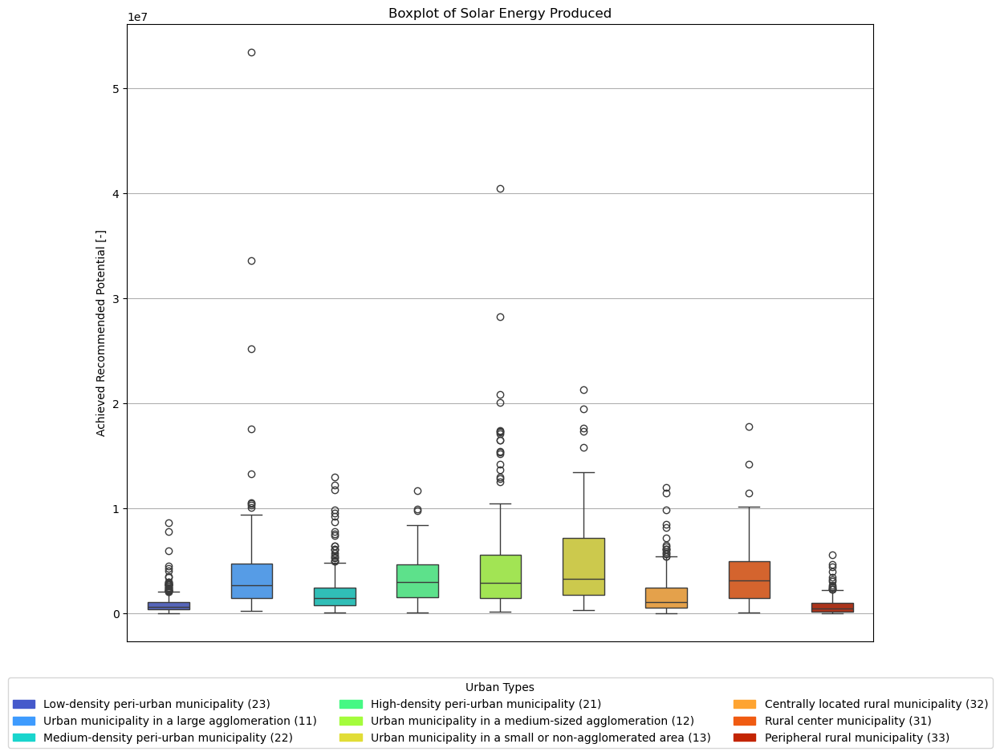

In [ ]:
# Create the figure and axes
fig, ax = plt.subplots(figsize=(12, 10))

# Create the boxplot with hue
sns.boxplot(x="urban_typo", y="total_energy", hue='urban_typo', data=solar_mun_gpd, ax=ax, palette="turbo", width=0.5)

# Create the stripplot with hue, but no legend for it
#sns.stripplot(x='urban_typo', y='total_energy', hue='urban_typo', data=solar_mun_gpd, jitter=True, linewidth=0.1, ax=ax, palette="turbo", alpha=0.5, legend=False)

# Set grid for y-axis
plt.grid(axis="y")

# Set title for the plot
plt.title("Boxplot of Solar Energy Produced")

# Remove x-ticks
ax.set_xticks([])

# define axes labels 
plt.xlabel("")
plt.ylabel("Achieved Recommended Potential [-]")

# Manually create a legend
# Retrieve the colors used in the plot
palette = sns.color_palette("turbo", n_colors=len(solar_mun_gpd['urban_typo'].unique()))

# Create the legend using patches
patches = [mpatches.Patch(color=palette[i], label=str(label)) 
           for i, label in enumerate(solar_mun_gpd['urban_typo'].unique())]

# Add the legend below the plot using bbox_to_anchor
ax.legend(handles=patches, title="Urban Types", loc="upper center", bbox_to_anchor=(0.5, -0.05), ncol=3)

# Show the plot
plt.show()


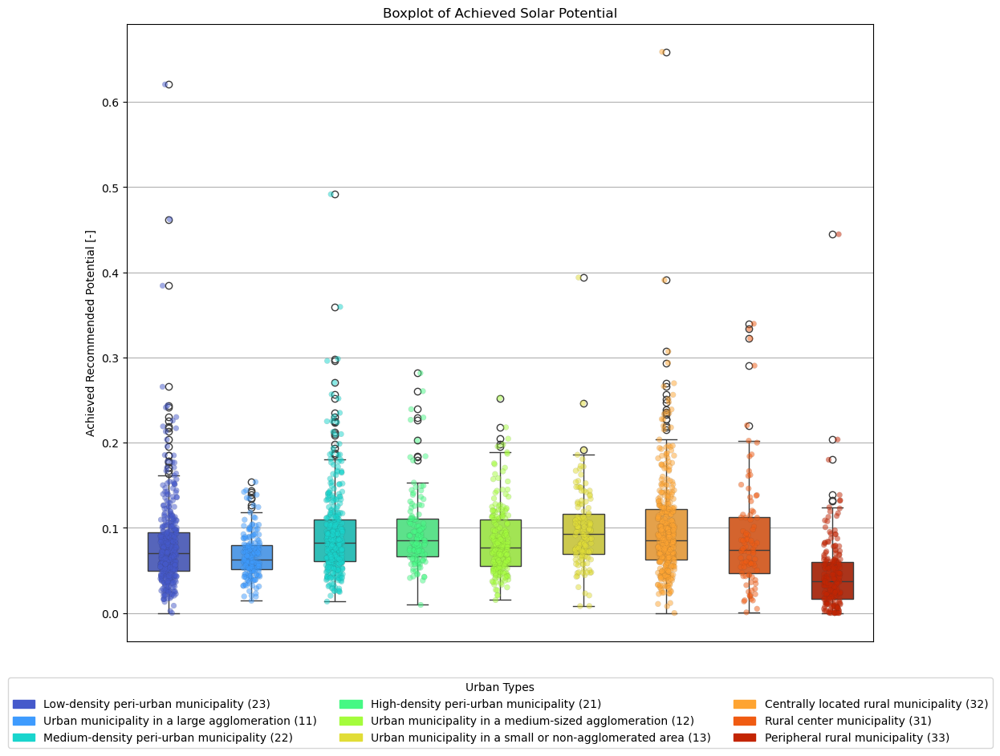

In [ ]:
# Create the figure and axes
fig, ax = plt.subplots(figsize=(12, 10))

# Create the boxplot with hue
sns.boxplot(x="urban_typo", y="achieved_rp", hue='urban_typo', data=solar_mun_gpd, ax=ax, palette="turbo", width=0.5)

# Create the stripplot with hue, but no legend for it
sns.stripplot(x='urban_typo', y='achieved_rp', hue='urban_typo', data=solar_mun_gpd, jitter=True, linewidth=0.1, ax=ax, palette="turbo", alpha=0.5, legend=False)

# Set grid for y-axis
plt.grid(axis="y")

# Set title for the plot
plt.title("Boxplot of Achieved Solar Potential")

# Remove x-ticks
ax.set_xticks([])

# define axes labels 
plt.xlabel("")
plt.ylabel("Achieved Recommended Potential [-]")

# Manually create a legend
# Retrieve the colors used in the plot
palette = sns.color_palette("turbo", n_colors=len(solar_mun_gpd['urban_typo'].unique()))

# Create the legend using patches
patches = [mpatches.Patch(color=palette[i], label=str(label)) 
           for i, label in enumerate(solar_mun_gpd['urban_typo'].unique())]

# Add the legend below the plot using bbox_to_anchor
ax.legend(handles=patches, title="Urban Types", loc="upper center", bbox_to_anchor=(0.5, -0.05), ncol=3)

# Show the plot
plt.show()


In [22]:
solar_mun_gpd["achieved_rp"].describe()

count    2131.000000
mean        0.084072
std         0.053426
min         0.000000
25%         0.052565
50%         0.074536
75%         0.101920
max         0.658908
Name: achieved_rp, dtype: float64

## Analyzing spatial distribution of municipal types

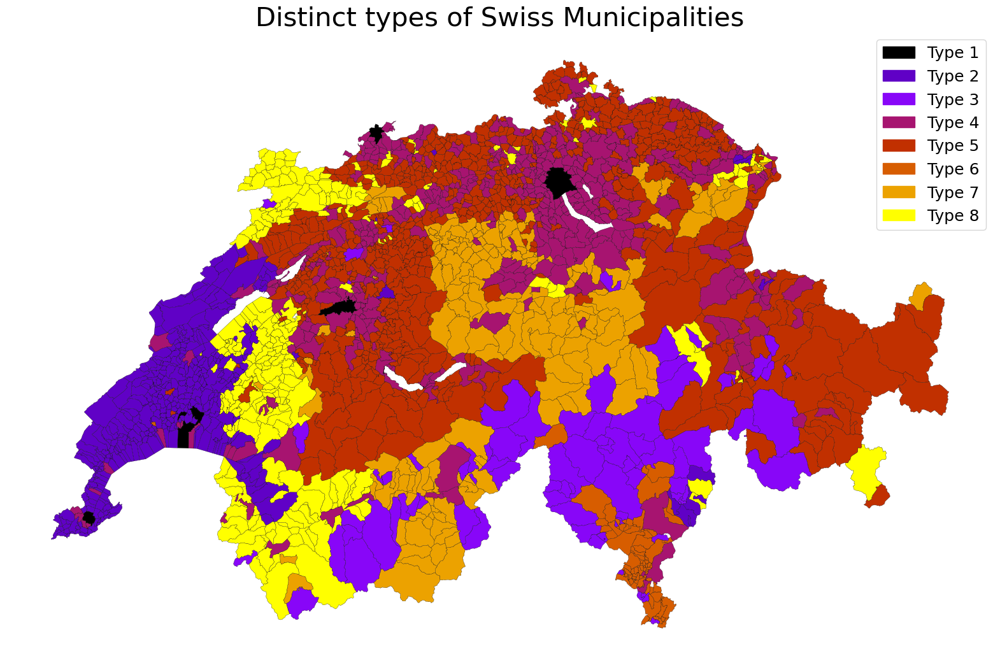

In [ ]:
# Generate a list of colors equally spaced on the viridis palette
n_colors = 8  # Assuming 8 types of municipalities
colors_viridis = [gnuplot(i / (n_colors - 1)) for i in range(n_colors)]  # RGBA tuples
colors_turbo = [turbo(i / (n_colors - 1)) for i in range(n_colors)]  # RGBA tuples

# Convert to HEX for consistent representation
colors_viridis_hex = [mcolors.to_hex(c) for c in colors_viridis]
colors_turbo_hex = [mcolors.to_hex(c) for c in colors_turbo]

# Define categories for the legend
categories = [f"Type {i+1}" for i in range(n_colors)]

# Plot the choropleth map
fig, ax = plt.subplots(figsize=(20, 15))

# Plot using the GeoDataFrame `solar_mun_gpd`
solar_mun_gpd.plot(
    ax=ax,
    column='municipality_type',  # Use the column to determine the color
    cmap='gnuplot',  # Colormap for shading (e.g., 'viridis', 'coolwarm', etc.)
    legend=False,  # Disable the automatic legend
    edgecolor='black',  # Add boundaries for municipalities
    linewidth=0.2,
)

# Create custom legend handles
legend_handles = [mpatches.Patch(color=color, label=category) for color, category in zip(colors_viridis_hex, categories)]

# Add the custom legend to the plot
plt.legend(handles=legend_handles, fontsize=18)

# Turn off axis ticks and labels for a cleaner map
plt.axis("off")

# Title and axis labels
plt.title("Distinct types of Swiss Municipalities", fontsize=30)
#plt.xlabel("Longitude", fontsize=14)
#plt.ylabel("Latitude", fontsize=14)

# Show the plot
plt.show()


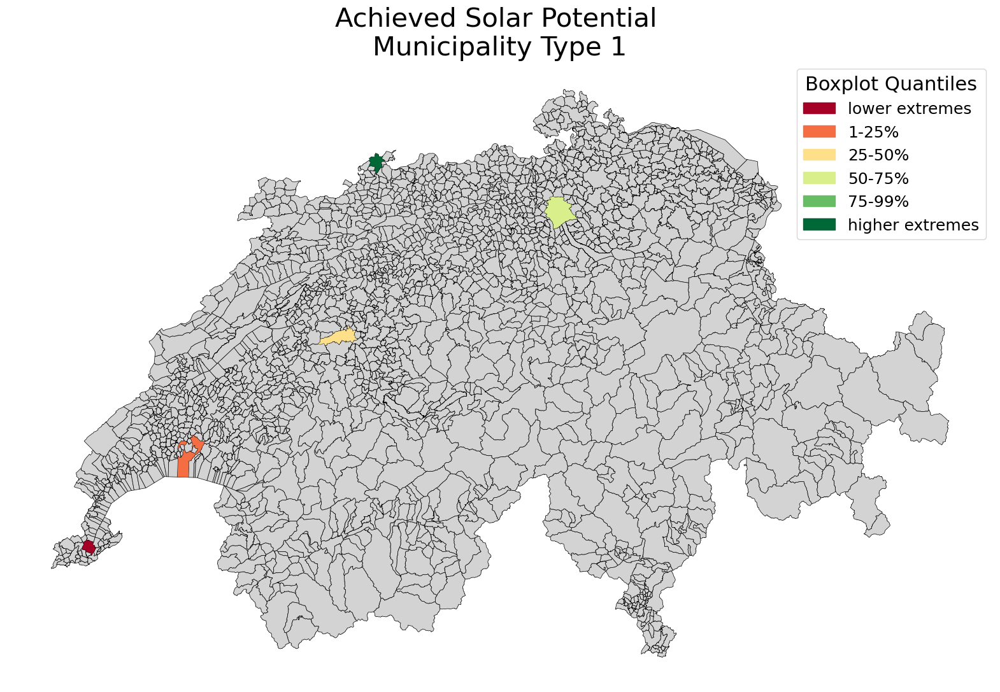

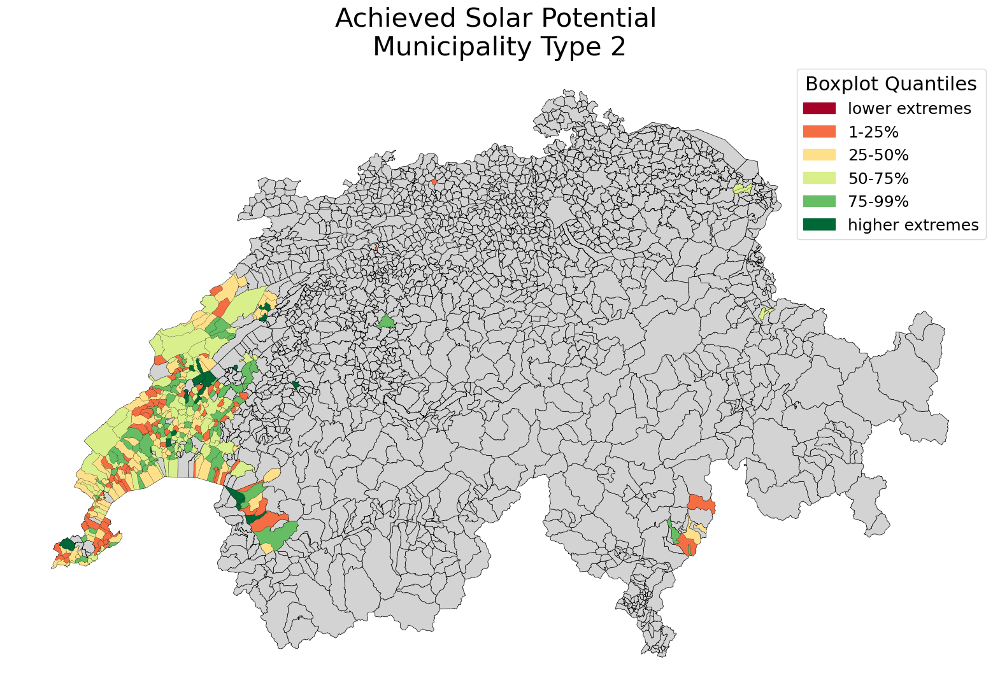

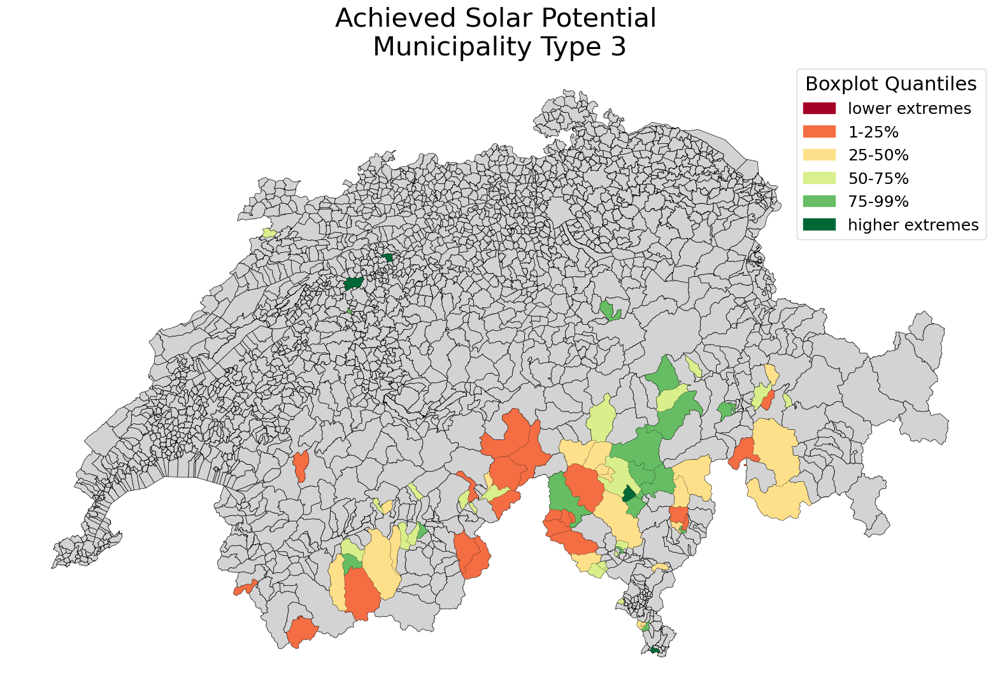

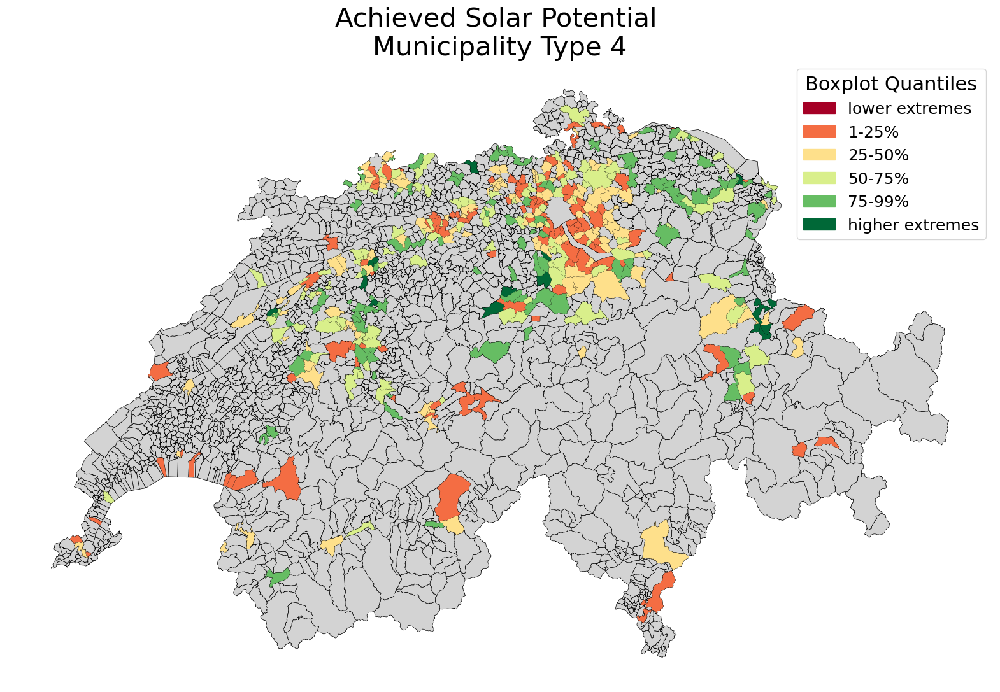

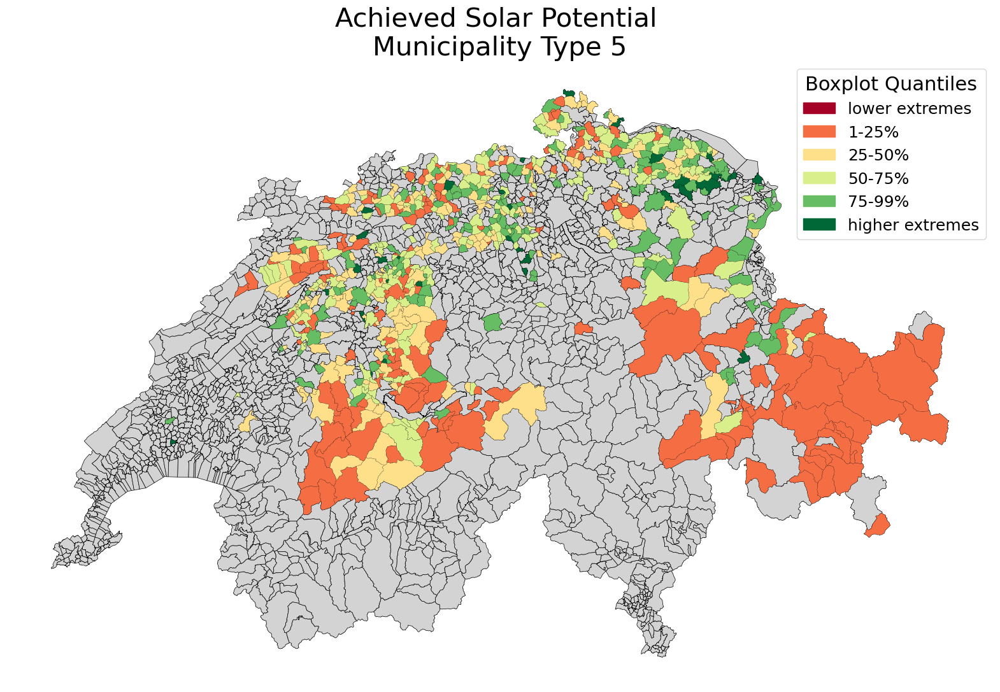

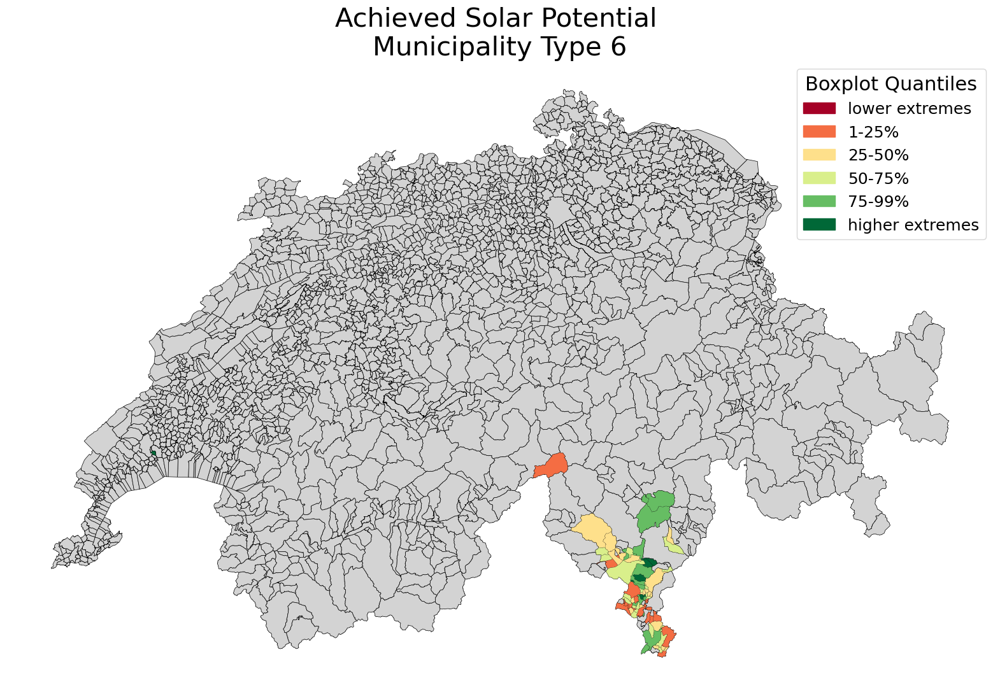

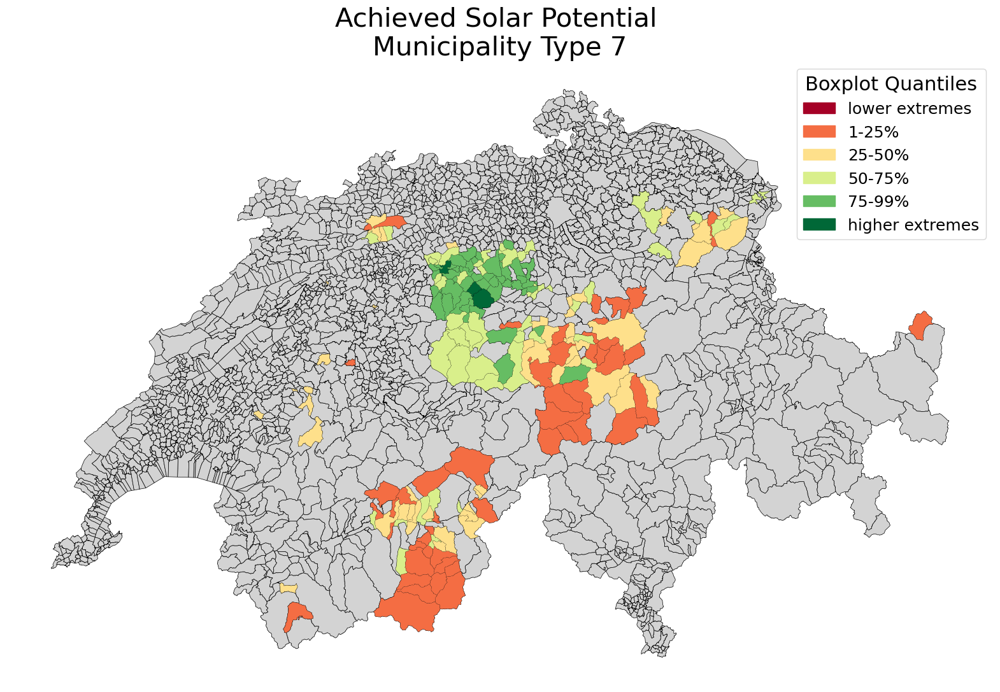

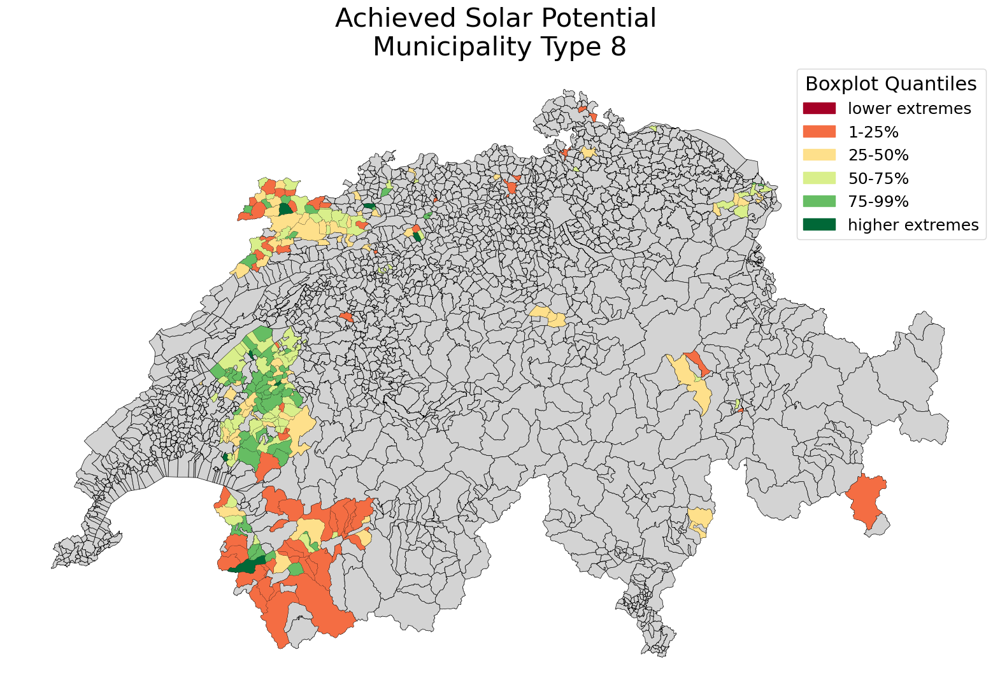

In [94]:
# Generate a list of colors equally spaced on the viridis palette
n_colors = 6 # Assuming 8 types of municipalities
colors_RdYlGn = [RdYlGn(i / (n_colors - 1)) for i in range(n_colors)]  # RGBA tuples

# Convert to HEX for consistent representation
colors_RdYlGn_hex = [mcolors.to_hex(c) for c in colors_RdYlGn]


# Define categories for the legend
categories = ["lower extremes", "1-25%", "25-50%", "50-75%", "75-99%", "higher extremes" ]


for type in range(1,9):
    type_df = solar_mun_gpd[solar_mun_gpd.municipality_type == type]
    
    fig, ax = plt.subplots(figsize=(20, 15))
    
    # Base map of Switzerland
    switzerland_municipalities.plot(
        ax=ax,
        color='lightgrey',
        edgecolor='black',
        linewidth=0.5
    )
    
    # Plot municipality data
    type_df.plot(
        ax=ax,
        column='achieved_rp',  # Use the column for color
        cmap='RdYlGn',         # Colormap
        legend=True,           # Display legend
        edgecolor='black',
        linewidth=0.1,         # Thin boundary
        scheme='BoxPlot'       # Scheme for binning
    )

    # Create custom legend handles
    legend_handles = [mpatches.Patch(color=color, label=category) for color, category in zip(colors_RdYlGn_hex, categories)]

    # Add the custom legend to the plot with a specific title size and label size
    plt.legend(
        handles=legend_handles,              # Specify the legend handles
        title="Boxplot Quantiles",           # Title of the legend
        fontsize=18,                          # Font size of the legend labels
        title_fontsize=22,                    # Font size of the legend title
    )
    
    # Add a title for each map
    plt.title(f"Achieved Solar Potential \nMunicipality Type {type}", fontsize=30)
    
    # Remove axis ticks and labels for a cleaner map
    plt.axis("off")
    
    # Save the plot as an image (optional)
    # plt.savefig(f"municipality_type_{type}.png", dpi=300, bbox_inches='tight')
    
    # Show the map
    plt.show()


In [ ]:
solar_mun_gpd[solar_mun_gpd.municipality_type==1]

,mun_name,canton_abr,pv_pot,pv_pot_reco,fpv_pot,fpv_pot_reco,roof_area,facade_area,total_power,total_energy,...,BEZIRKSNUM,KANTONSNUM,NAME,GEM_FLAECH,SEE_FLAECH,ICC,SHN,EINWOHNERZ,HIST_NR,geometry
151,Zürich,ZH,1.173020e+09,8.256447e+08,8.140466e+08,3.866836e+08,1.288725e+07,1.990452e+07,53443.86,53443860.0,...,112.0,1.0,Zürich,9188.0,395.0,CH,CH01120261,427721,13688.0,"POLYGON Z ((2685056.895 1244517.809 405.85, 26..."
191,Bern,BE,5.606095e+08,4.128140e+08,3.271737e+08,1.716060e+08,5.427322e+06,7.513526e+06,25141.86,25141860.0,...,246.0,2.0,Bern,5162.0,0.0,CH,CH02460351,134506,15029.0,"POLYGON Z ((2591818.806 1196465.129 640.092, 2..."
888,Basel,BS,5.848140e+08,4.261760e+08,3.332382e+08,1.551066e+08,5.866243e+06,8.150225e+06,33590.46,33590460.0,...,NaN,12.0,Basel,2385.0,0.0,CH,CH12002701,173552,11693.0,"POLYGON Z ((2608828.375 1265964.023 289.266, 2..."
1692,Lausanne,VD,3.734897e+08,3.137341e+08,2.650313e+08,1.489611e+08,3.465463e+06,5.836569e+06,17498.35,17498350.0,...,2225.0,22.0,Lausanne,6763.0,2626.0,CH,CH22255586,141418,14649.0,MULTIPOLYGON Z (((2534437.97 1152520.386 376.9...
2056,Genève,GE,4.012565e+08,3.320554e+08,2.521632e+08,1.155805e+08,3.848463e+06,6.174442e+06,8569.50,8569500.0,...,NaN,25.0,Genève,1830.0,234.0,CH,CH25006621,203840,12099.0,"POLYGON Z ((2498060.531 1119818.414 449.833, 2..."


## Analyzing spatial distribution of urban types

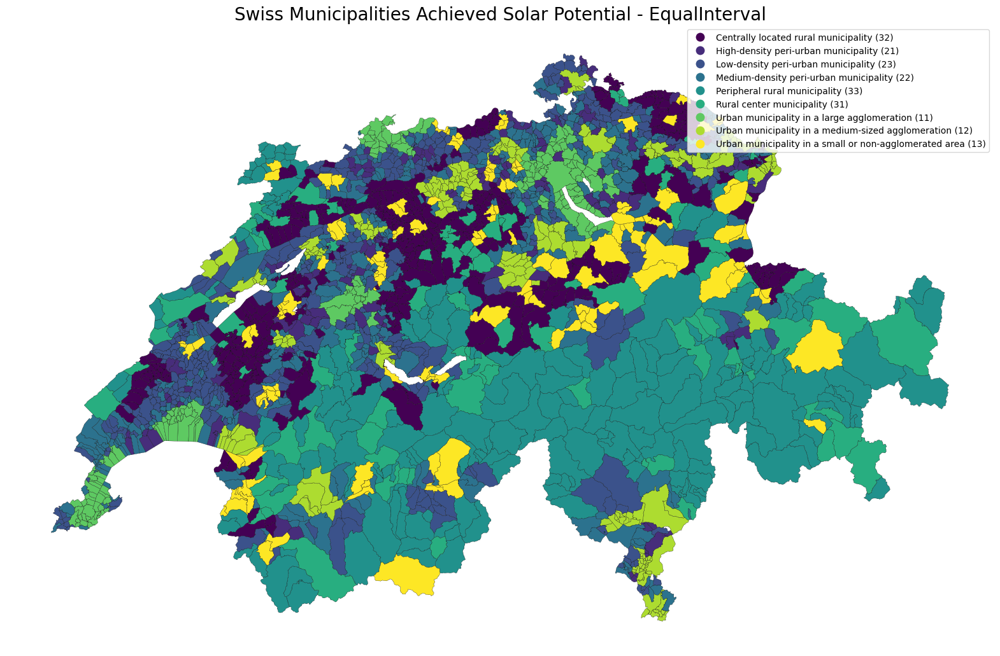

In [ ]:
# Plot the choropleth map
fig, ax = plt.subplots(figsize=(20, 15))

# Plot using the GeoDataFrame `solar_mun_df`
solar_mun_gpd.plot(
    ax=ax,
    column='urban_typo',  # Use the column to determine the color
    cmap='viridis',                     # Colormap for shading (e.g., 'viridis', 'coolwarm', etc.)
    legend=True,                        # Display a legend
    edgecolor='black',                  # Add boundaries for municipalities
    linewidth=0.2,            
)

# Add a title
plt.title("Choropleth Map of Swiss Municipalities by Achieved Solar Potential", size=20)

# Turn off axis ticks and labels for a cleaner map
plt.axis("off")

plt.title("Swiss Municipalities Achieved Solar Potential - EqualInterval", fontsize=20)
plt.xlabel("Longitude", fontsize=14)
plt.ylabel("Latitude", fontsize=14)

# Show the plot
plt.show()